In [1]:
from String_method import *

In [2]:
import numpy as np
from time import time
import matplotlib.pyplot  as plt
import plotly.graph_objects as go

# Visualize the function V(x) and Initial string

In [3]:
#set V(x)
[X,Y]=np.meshgrid(np.linspace(-1.3,1.3,200),np.linspace(-0.3,1.3,200))
Z=(1-X*X-Y*Y)*(1-X*X-Y*Y)+Y*Y/(X*X+Y*Y)

# [X,Y]=np.meshgrid(np.linspace(-4,4,200),np.linspace(-4,4,200))
# Z=1+np.sin(X)*np.sin(X)+np.sin(Y)*np.sin(Y)-np.exp(-(X*X+Y*Y));



In [4]:
#init string need not be local minima
a=np.array([-.5,0.5])
b=np.array([0.5,.5])

In [5]:
a=np.array([np.pi,np.pi])
b=np.array([0.02,.01])

In [6]:
%matplotlib inline
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y)]) # z is 2D,x,y could be 1d 2d
fig.update_layout(title='V', autosize=False,
                      width=500, height=500,
                      margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [7]:
Init=Init_stringA(a,b,20)

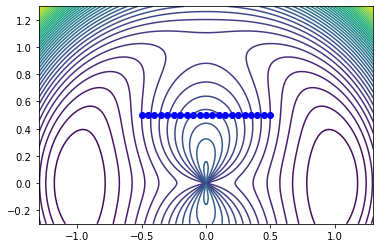

In [8]:
plt.contour(X,Y,Z,50)
plt.plot(Init[:,0],Init[:,1],'b--o')

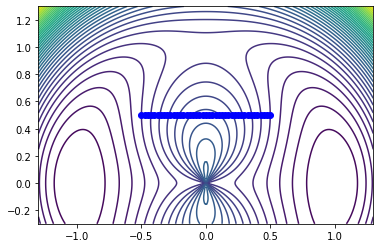

In [13]:
plt.contour(X,Y,Z,50)
plt.plot(Init[:,0],Init[:,1],'b--o')

# Reparameterization

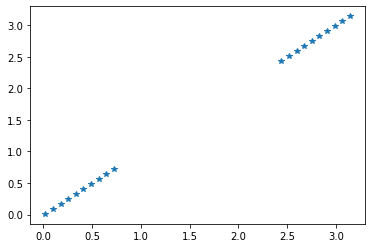

In [17]:
AA=np.append(Init[:10,:],Init[-10:,:]).reshape(20,2)#construct a nonuniform distributed string
plt.plot(AA[:,0],AA[:,1],'*')

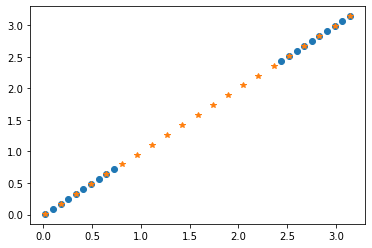

In [18]:
BB=Repara(AA,N=20)#reparameterization
plt.plot(AA[:,0],AA[:,1],'o')
plt.plot(BB[:,0],BB[:,1],'*')

# Evolve string

In [9]:
#set parameters

N=20
TOL=max(pow(N,-4),pow(10,-10))
dt=0.05*min(0.2,1/N)



In [10]:
# Init_string=Init_stringA(a,b,N)

In [11]:
MAXITER=5000#max iteration steps
steps=1
Phi=Init_stringA(a,b,N)
iter_error=[0]*(N+1)
start=time()
while 1:
    print('Iteration %d'%steps)
    Phi_new=np.zeros_like(Phi)#reset Phi_new
    #update string 
    for i in range(N+1):
        rg=rungeKutta(Phi[i,:],dt,gradient_V)
#         rg=euler(Phi[i,:],dt,gradient_V(Phi[i,:]))
        iter_error[i]=LA.norm(rg)/dt
        Phi_new[i,:]=Phi[i,:]+rg#iteration scheme
    #reparameterization
    Phi=Repara(Phi_new,N)#update Phi
    steps+=1
    print(max(iter_error))
    print('\n')
    if max(iter_error)<TOL:#if d<TOL stop iteration
        print('converges after %d steps'%steps)
        break
    if steps>MAXITER:
        print('does not converge until %d iteration'%MAXITER)
        break
print('time for iteration is %f s'%(time()-start))

Iteration 1
2.050526675222901


Iteration 2
2.0449794962087


Iteration 3
2.0392944281672287


Iteration 4
2.033472752824944


Iteration 5
2.027515809230046


Iteration 6
2.0214249927604353


Iteration 7
2.015201754069026


Iteration 8
2.0088475979681566


Iteration 9
2.002364082255036


Iteration 10
1.995752816480231


Iteration 11
1.9890154606613413


Iteration 12
1.9821537239441238


Iteration 13
1.9751693632134093


Iteration 14
1.9680641816562707


Iteration 15
1.960840027279985


Iteration 16
1.9534987913873976


Iteration 17
1.946042407012394


Iteration 18
1.9384728473182313


Iteration 19
1.9307921239615422


Iteration 20
1.923002285424873


Iteration 21
1.915105415320658


Iteration 22
1.9071036306695606


Iteration 23
1.8989990801561336


Iteration 24
1.8907939423647706


Iteration 25
1.8824904239989182


Iteration 26
1.8740907580865207


Iteration 27
1.8655972021746594


Iteration 28
1.8570120365163274


Iteration 29
1.8483375622522538


Iteration 30
1.8395760995906605


It

0.15816305491258575


Iteration 306
0.15657844035990265


Iteration 307
0.15500960403581235


Iteration 308
0.15345639174908415


Iteration 309
0.15191865072817706


Iteration 310
0.1503962296108086


Iteration 311
0.14888897843351626


Iteration 312
0.14739674862121427


Iteration 313
0.14591939297674988


Iteration 314
0.14445676567046073


Iteration 315
0.14300872222973823


Iteration 316
0.14157511952859778


Iteration 317
0.14015581577726016


Iteration 318
0.13875067051174592


Iteration 319
0.13735954458348532


Iteration 320
0.13598230014894677


Iteration 321
0.13461880065928528


Iteration 322
0.1332689108500139


Iteration 323
0.13193249673070012


Iteration 324
0.1306094255746888


Iteration 325
0.12929956590885416


Iteration 326
0.12800278750338256


Iteration 327
0.12671896136158783


Iteration 328
0.12544795970976053


Iteration 329
0.12418965598705367


Iteration 330
0.12294392483540549


Iteration 331
0.1217106420895013


Iteration 332
0.12048968476677585


Iteration 

0.01306907315455785


Iteration 553
0.01293772957584462


Iteration 554
0.012807705938763424


Iteration 555
0.012678988980166003


Iteration 556
0.012551565570126792


Iteration 557
0.012425422710606168


Iteration 558
0.01230054753412717


Iteration 559
0.012176927302465371


Iteration 560
0.012054549405351913


Iteration 561
0.011933401359189489


Iteration 562
0.011813470805781167


Iteration 563
0.011694745511071941


Iteration 564
0.011577213363902902


Iteration 565
0.011460862374777812


Iteration 566
0.011345680674642084


Iteration 567
0.01123165651367394


Iteration 568
0.011118778260087721


Iteration 569
0.011007034398949097


Iteration 570
0.010896413531002225


Iteration 571
0.010786904371508595


Iteration 572
0.010678495749097516


Iteration 573
0.010571176604628106


Iteration 574
0.01046493599006271


Iteration 575
0.010359763067351549


Iteration 576
0.010255647107328592


Iteration 577
0.010152577488618449


Iteration 578
0.010050543696554249


Iteration 579
0.0099

0.0013063392869887126


Iteration 781
0.0012932103616734119


Iteration 782
0.001280213384167983


Iteration 783
0.0012673470283773721


Iteration 784
0.0012546099815339308


Iteration 785
0.0012420009440634702


Iteration 786
0.0012295186294526699


Iteration 787
0.001217161764117817


Iteration 788
0.0012049290872748616


Iteration 789
0.0011928193508107792


Iteration 790
0.0011808313191562295


Iteration 791
0.0011689637691594896


Iteration 792
0.0011572154899616583


Iteration 793
0.0011455852828731116


Iteration 794
0.0011340719612512025


Iteration 795
0.0011226743503791872


Iteration 796
0.0011113912873463702


Iteration 797
0.0011002216209294526


Iteration 798
0.0010891642114750739


Iteration 799
0.0010782179307835334


Iteration 800
0.0010673816619936793


Iteration 801
0.0010566542994689572


Iteration 802
0.0010460347486846028


Iteration 803
0.001035521926115965


Iteration 804
0.0010251147591279581


Iteration 805
0.0010148121858656177


Iteration 806
0.0010046131551

6.980397777809588e-05


Iteration 1071
6.910243613876986e-05


Iteration 1072
6.84079451101223e-05


Iteration 1073
6.77204338323382e-05


Iteration 1074
6.703983215775558e-05


Iteration 1075
6.636607064370811e-05


Iteration 1076
6.569908054543989e-05


Iteration 1077
6.50387938090913e-05


Iteration 1078
6.438514306475534e-05


Iteration 1079
6.373806161960383e-05


Iteration 1080
6.309748345108267e-05


Iteration 1081
6.246334320017542e-05


Iteration 1082
6.183557616473469e-05


Iteration 1083
6.121411829288044e-05


Iteration 1084
6.0598906176464776e-05


Iteration 1085
5.998987704460224e-05


Iteration 1086
5.938696875726521e-05


Iteration 1087
5.879011979894378e-05


Iteration 1088
5.8199269272369196e-05


Iteration 1089
5.761435689230037e-05


Iteration 1090
5.7035322979373e-05


Iteration 1091
5.646210845401032e-05


Iteration 1092
5.589465483039522e-05


Iteration 1093
5.533290421050277e-05


Iteration 1094
5.477679927819289e-05


Iteration 1095
5.4226283293362285e-05


Ite

6.500983162979779e-06


Iteration 1306
6.435647195986238e-06


Iteration 1307
6.370967866377524e-06


Iteration 1308
6.306938574838205e-06


Iteration 1309
6.243552788377076e-06


converges after 1310 steps
time for iteration is 4.727371 s


In [36]:
s=[]
length=len(Phi)
s.append(0)#s_0=0
for i in range(length-1):
    s.append(s[i]+LA.norm(Phi[i+1,:]-Phi[i,:]))
alpha=np.array(s)/s[-1]


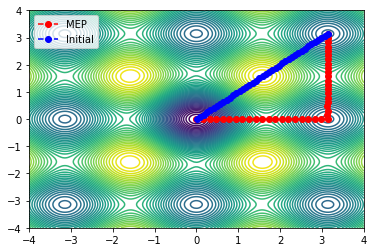

In [37]:
plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.legend(['MEP','Initial'])

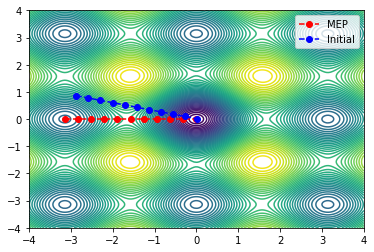

In [15]:
plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.legend(['MEP','Initial'])

In [13]:
Init_string=Init_stringA(a,b,N)

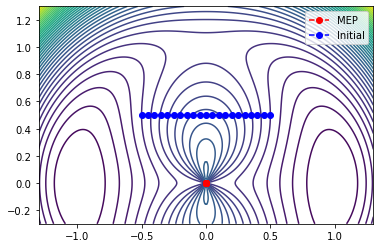

In [14]:
plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.legend(['MEP','Initial'])

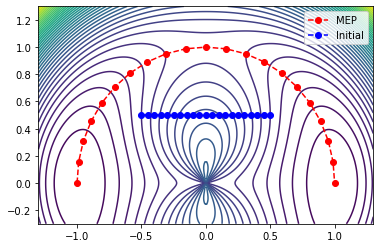

In [26]:
plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.legend(['MEP','Initial'])

# dynamic of saddle point

In [38]:
zfinal=list(map(V,Phi))

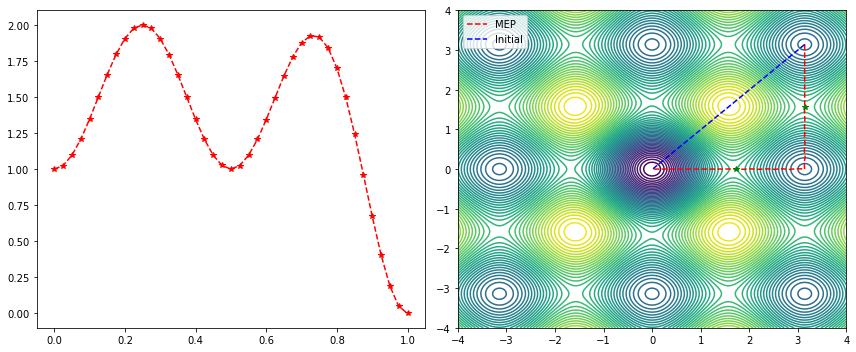

In [53]:
plt.figure(figsize=[12,5])
plt.subplot(1, 2, 1)
plt.plot(alpha,zfinal,'--r*')

plt.subplot(1, 2, 2)
plt.plot(Phi[:,0],Phi[:,1],'--r')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--')
plt.legend(['MEP','Initial'])
plt.plot(Phi[maxid,0],Phi[maxid,1],'g*')
plt.plot(Phi[sec,0],Phi[sec,1],'g*')

plt.tight_layout()

In [50]:
def find_sd(zfinal):
    length=len(zfinal)
    sd=[]
    for i in range(1,length-1):
        if zfinal[i]>zfinal[i-1] and zfinal[i]>zfinal[i+1]:
            sd.append(i)
    return sd

In [56]:
def sd_dynamic(phi,tao):
    gradient=gradient_V(phi)
    return gradient-2*np.matmul(tao,gradient)*tao

In [47]:
m=0
length=len(zfinal)
maxid=0
for i in range(1,length):
    if zfinal[i]>zfinal[maxid]:
        maxid=i

In [48]:
m=0
length=len(zfinal)
sec=0
for i in range(maxid+5,length):
    if zfinal[i]>zfinal[sec]:
        sec=i

In [54]:
LA.norm(gradient_V(Phi[maxid])),LA.norm(gradient_V(Phi[sec]))

(0.00318355024120253, 0.13819931092703847)

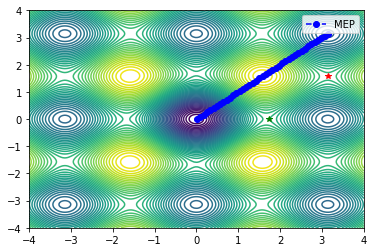

In [55]:
# plt.plot(Phi[:,0],Phi[:,1],'--ro')
plt.contour(X,Y,Z,50)
plt.plot(Init_string[:,0],Init_string[:,1],'b--o')
plt.legend(['MEP','Initial'])
plt.plot(Phi[maxid,0],Phi[maxid,1],'r*')
plt.plot(Phi[sec,0],Phi[sec,1],'g*')

## climbing string with truncated string

In [57]:
I_string=Phi[sec:,:]
II_string=Phi[:maxid+1,:]

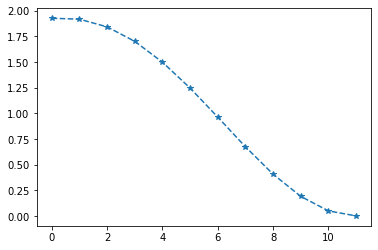

In [116]:
II=list(map(V,I_string))
plt.plot(II,'--*')

In [67]:
N=len(II_string)-1
TOL=max(pow(N,-4),pow(10,-10))
dt=0.05*min(0.2,1/N)

In [68]:
MAXITER=2500#max iteration steps
steps=1
Phi=II_string
iter_error=[0]*(N+1)
start=time()
while 1:
    print('Iteration %d'%steps)
    Phi_new=np.zeros_like(Phi)#reset Phi_new
    #update string except the saddle point
    for i in range(N):
        rg=rungeKutta(Phi[i,:],dt,gradient_V)
#         rg=euler(Phi[i,:],dt,gradient_V(Phi[i,:]))
        iter_error[i]=LA.norm(rg)/dt
        Phi_new[i,:]=Phi[i,:]+rg#iteration scheme
        
    #saddle point update
    difference=Phi[-1]-Phi[-2]
    tao=difference/LA.norm(difference)
    rg=rungeKutta(Phi[-1],dt,lambda x:sd_dynamic(x,tao))
    iter_error[N]=LA.norm(rg)/dt
    Phi_new[N,:]=Phi[N,:]+rg
    
    #reparameterization
    Phi=Repara(Phi_new,N)#update Phi
#     iter_error=list(map(gradient_V,Phi))
    steps+=1
    ee=max(iter_error)
    his_error.append(ee)
    print(ee)
    print('\n')
    if ee<TOL:#if d<TOL stop iteration
        print('converges after %d steps'%steps)
        break
    if steps>MAXITER:
        print('does not converge until %d iteration'%MAXITER)
        break
time_cost=time()-start

Iteration 1
0.999976020344019


Iteration 2
0.9999760777031802


Iteration 3
0.9999761343349041


Iteration 4
0.9999761904160555


Iteration 5
0.9999762459642791


Iteration 6
0.9999763009962523


Iteration 7
0.9999763555277094


Iteration 8
0.9999764095734598


Iteration 9
0.9999764631474136


Iteration 10
0.9999765162626052


Iteration 11
0.9999765689312181


Iteration 12
0.9999766211646133


Iteration 13
0.9999766729733557


Iteration 14
0.9999767243672425


Iteration 15
0.9999767753553332


Iteration 16
0.9999768259459789


Iteration 17
0.9999768761468516


Iteration 18
0.9999769259649751


Iteration 19
0.9999769754067553


Iteration 20
0.999977024478011


Iteration 21
0.999977073184003


Iteration 22
0.9999771215294662


Iteration 23
0.999977169518638


Iteration 24
0.9999772171552885


Iteration 25
0.9999772644427499


Iteration 26
0.9999773113839453


Iteration 27
0.9999773579814156


Iteration 28
0.9999774042373495


Iteration 29
0.999977450153608


Iteration 30
0.9999774957317

0.9999821707272899


Iteration 334
0.9999821731735973


Iteration 335
0.9999821755948511


Iteration 336
0.9999821779913013


Iteration 337
0.9999821803631974


Iteration 338
0.999982182710785


Iteration 339
0.9999821850343081


Iteration 340
0.9999821873340078


Iteration 341
0.999982189610123


Iteration 342
0.9999821918628913


Iteration 343
0.9999821940925466


Iteration 344
0.9999821962993214


Iteration 345
0.9999821984834463


Iteration 346
0.9999822006451494


Iteration 347
0.9999822027846565


Iteration 348
0.999982204902192


Iteration 349
0.999982206997978


Iteration 350
0.9999822090722348


Iteration 351
0.9999822111251799


Iteration 352
0.9999822131570307


Iteration 353
0.9999822151680007


Iteration 354
0.9999822171583026


Iteration 355
0.9999822191281468


Iteration 356
0.9999822210777428


Iteration 357
0.9999822230072977


Iteration 358
0.9999822249170164


Iteration 359
0.9999822268071022


Iteration 360
0.9999822286777578


Iteration 361
0.9999822305291823


Ite

0.99998239555752


Iteration 600
0.9999823957227094


Iteration 601
0.9999823958862425


Iteration 602
0.999982396048135


Iteration 603
0.9999823962084043


Iteration 604
0.9999823963670659


Iteration 605
0.9999823965241359


Iteration 606
0.9999823966796301


Iteration 607
0.9999823968335642


Iteration 608
0.9999823969859539


Iteration 609
0.9999823971368144


Iteration 610
0.999982397286161


Iteration 611
0.9999823974340087


Iteration 612
0.9999823975803723


Iteration 613
0.9999823977252672


Iteration 614
0.9999823978687074


Iteration 615
0.9999823980107077


Iteration 616
0.999982398151282


Iteration 617
0.9999823982904449


Iteration 618
0.9999823984282101


Iteration 619
0.999982398564592


Iteration 620
0.9999823986996044


Iteration 621
0.9999823988332602


Iteration 622
0.9999823989655738


Iteration 623
0.999982399096558


Iteration 624
0.9999823992262261


Iteration 625
0.9999823993545917


Iteration 626
0.9999823994816673


Iteration 627
0.9999823996074658


Iterat



Iteration 886
0.999982411088598


Iteration 887
0.9999824110977032


Iteration 888
0.9999824111067167


Iteration 889
0.9999824111156399


Iteration 890
0.9999824111244735


Iteration 891
0.9999824111332185


Iteration 892
0.9999824111418754


Iteration 893
0.9999824111504454


Iteration 894
0.9999824111589293


Iteration 895
0.9999824111673282


Iteration 896
0.9999824111756428


Iteration 897
0.9999824111838737


Iteration 898
0.9999824111920222


Iteration 899
0.9999824112000885


Iteration 900
0.999982411208074


Iteration 901
0.9999824112159793


Iteration 902
0.9999824112238053


Iteration 903
0.9999824112315525


Iteration 904
0.9999824112392219


Iteration 905
0.9999824112468143


Iteration 906
0.9999824112543304


Iteration 907
0.9999824112617712


Iteration 908
0.9999824112691372


Iteration 909
0.999982411276429


Iteration 910
0.9999824112836477


Iteration 911
0.9999824112907939


Iteration 912
0.9999824112978682


Iteration 913
0.9999824113048715


Iteration 914
0.99998

0.9999824119221951


Iteration 1137
0.9999824119229235


Iteration 1138
0.9999824119236446


Iteration 1139
0.9999824119243584


Iteration 1140
0.9999824119250652


Iteration 1141
0.999982411925765


Iteration 1142
0.9999824119264576


Iteration 1143
0.9999824119271433


Iteration 1144
0.999982411927822


Iteration 1145
0.9999824119284942


Iteration 1146
0.9999824119291593


Iteration 1147
0.9999824119298178


Iteration 1148
0.9999824119304696


Iteration 1149
0.9999824119311151


Iteration 1150
0.999982411931754


Iteration 1151
0.9999824119323862


Iteration 1152
0.9999824119330125


Iteration 1153
0.9999824119336322


Iteration 1154
0.9999824119342456


Iteration 1155
0.9999824119348532


Iteration 1156
0.9999824119354545


Iteration 1157
0.9999824119360496


Iteration 1158
0.999982411936639


Iteration 1159
0.9999824119372223


Iteration 1160
0.9999824119377996


Iteration 1161
0.9999824119383716


Iteration 1162
0.9999824119389372


Iteration 1163
0.9999824119394976


Iteration 1

0.9999824119917899


Iteration 1456
0.9999824119918189


Iteration 1457
0.9999824119918479


Iteration 1458
0.9999824119918763


Iteration 1459
0.9999824119919044


Iteration 1460
0.9999824119919322


Iteration 1461
0.9999824119919599


Iteration 1462
0.9999824119919873


Iteration 1463
0.9999824119920144


Iteration 1464
0.999982411992041


Iteration 1465
0.9999824119920675


Iteration 1466
0.9999824119920937


Iteration 1467
0.9999824119921199


Iteration 1468
0.9999824119921455


Iteration 1469
0.9999824119921711


Iteration 1470
0.9999824119921961


Iteration 1471
0.999982411992221


Iteration 1472
0.9999824119922457


Iteration 1473
0.9999824119922701


Iteration 1474
0.9999824119922945


Iteration 1475
0.9999824119923183


Iteration 1476
0.9999824119923421


Iteration 1477
0.9999824119923655


Iteration 1478
0.9999824119923888


Iteration 1479
0.9999824119924118


Iteration 1480
0.9999824119924345


Iteration 1481
0.9999824119924571


Iteration 1482
0.9999824119924796


Iteration

0.9999824119945455


Iteration 1761
0.999982411994547


Iteration 1762
0.9999824119945482


Iteration 1763
0.9999824119945495


Iteration 1764
0.9999824119945507


Iteration 1765
0.999982411994552


Iteration 1766
0.9999824119945535


Iteration 1767
0.9999824119945545


Iteration 1768
0.9999824119945557


Iteration 1769
0.9999824119945572


Iteration 1770
0.9999824119945584


Iteration 1771
0.9999824119945593


Iteration 1772
0.9999824119945608


Iteration 1773
0.9999824119945618


Iteration 1774
0.9999824119945631


Iteration 1775
0.9999824119945643


Iteration 1776
0.9999824119945655


Iteration 1777
0.9999824119945665


Iteration 1778
0.9999824119945676


Iteration 1779
0.9999824119945688


Iteration 1780
0.9999824119945698


Iteration 1781
0.9999824119945708


Iteration 1782
0.999982411994572


Iteration 1783
0.9999824119945732


Iteration 1784
0.9999824119945742


Iteration 1785
0.9999824119945752


Iteration 1786
0.9999824119945763


Iteration 1787
0.9999824119945772


Iteration 

0.9999824119946734


Iteration 2089
0.9999824119946734


Iteration 2090
0.9999824119946735


Iteration 2091
0.9999824119946735


Iteration 2092
0.9999824119946737


Iteration 2093
0.9999824119946737


Iteration 2094
0.9999824119946737


Iteration 2095
0.9999824119946737


Iteration 2096
0.9999824119946737


Iteration 2097
0.9999824119946737


Iteration 2098
0.9999824119946737


Iteration 2099
0.9999824119946739


Iteration 2100
0.9999824119946739


Iteration 2101
0.9999824119946741


Iteration 2102
0.9999824119946741


Iteration 2103
0.9999824119946741


Iteration 2104
0.9999824119946741


Iteration 2105
0.9999824119946741


Iteration 2106
0.9999824119946741


Iteration 2107
0.9999824119946741


Iteration 2108
0.9999824119946744


Iteration 2109
0.9999824119946744


Iteration 2110
0.9999824119946744


Iteration 2111
0.9999824119946746


Iteration 2112
0.9999824119946744


Iteration 2113
0.9999824119946744


Iteration 2114
0.9999824119946746


Iteration 2115
0.9999824119946746


Iterati

0.9999824119946777


Iteration 2317
0.9999824119946777


Iteration 2318
0.9999824119946777


Iteration 2319
0.9999824119946777


Iteration 2320
0.9999824119946777


Iteration 2321
0.9999824119946777


Iteration 2322
0.9999824119946777


Iteration 2323
0.9999824119946777


Iteration 2324
0.9999824119946777


Iteration 2325
0.9999824119946777


Iteration 2326
0.9999824119946777


Iteration 2327
0.9999824119946777


Iteration 2328
0.9999824119946777


Iteration 2329
0.9999824119946777


Iteration 2330
0.9999824119946777


Iteration 2331
0.9999824119946777


Iteration 2332
0.9999824119946777


Iteration 2333
0.9999824119946777


Iteration 2334
0.9999824119946777


Iteration 2335
0.9999824119946777


Iteration 2336
0.9999824119946777


Iteration 2337
0.9999824119946777


Iteration 2338
0.9999824119946777


Iteration 2339
0.9999824119946777


Iteration 2340
0.9999824119946777


Iteration 2341
0.9999824119946777


Iteration 2342
0.9999824119946777


Iteration 2343
0.9999824119946777


Iterati

## illustrate the influence of  climbing string

In [69]:
s=[]
length=len(Phi)
s.append(0)#s_0=0
for i in range(length-1):
    s.append(s[i]+LA.norm(Phi[i+1,:]-Phi[i,:]))
alpha=np.array(s)/s[-1]

In [70]:
zfinal=list(map(V,Phi))

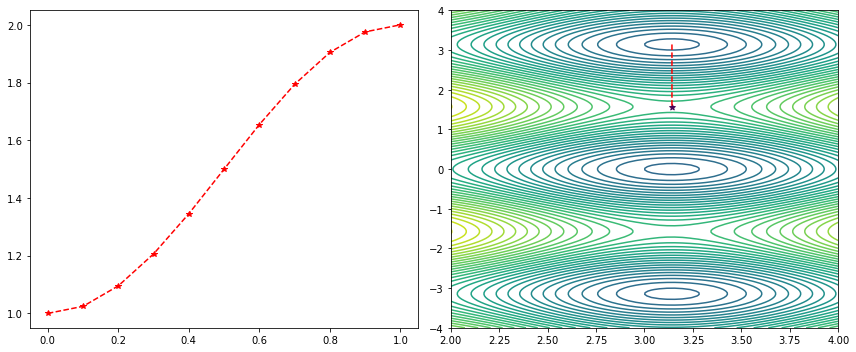

In [110]:
plt.figure(figsize=[12,5])
plt.subplot(1, 2, 1)
plt.plot(alpha,zfinal,'--r*')

plt.subplot(1, 2, 2)
plt.plot(Phi[:,0],Phi[:,1],'--r')
plt.contour(X,Y,Z,50)
# plt.plot(II_string[:,0],II_string[:,1],'b--')
# plt.legend(['MEP','Initial'])
plt.plot(Phi[maxid,0],Phi[maxid,1])
plt.scatter(II_string[N,0],II_string[N,1],c=1,marker='*')
plt.xlim([2,4])
# plt.plot(Phi[sec,0],Phi[sec,1],'g*')

plt.tight_layout()

(3.13, 3.15)

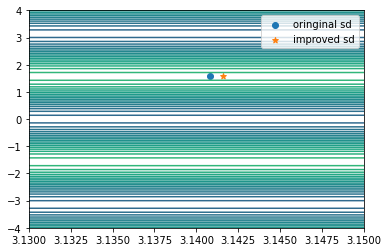

In [111]:
plt.scatter(II_string[N,0],II_string[N,1])
plt.scatter(Phi[maxid,0],Phi[maxid,1],marker='*')
plt.legend(['oringinal sd','improved sd'])
plt.contour(X,Y,Z,50)
plt.xlim([3.13,3.15])

In [80]:
II_string[N],Phi[maxid]

(array([3.14079036, 1.56942045]), array([3.14157887, 1.57080322]))

In [82]:
LA.norm(gradient_V(Phi[maxid])),LA.norm(gradient_V(II_string[N]))

(5.3442454126211955e-14, 0.00318355024120253)

In [112]:
plt.scatter?

In [117]:
N=len(I_string)-1
TOL=max(pow(N,-4),pow(10,-10))
dt=0.05*min(0.2,1/N)

In [118]:
MAXITER=2500#max iteration steps
steps=1
Phi=I_string
iter_error=[0]*(N+1)
start=time()
while 1:
    print('Iteration %d'%steps)
    Phi_new=np.zeros_like(Phi)#reset Phi_new
    #update string except the saddle point
    for i in range(N):
        rg=rungeKutta(Phi[i,:],dt,gradient_V)
#         rg=euler(Phi[i,:],dt,gradient_V(Phi[i,:]))
        iter_error[i]=LA.norm(rg)/dt
        Phi_new[i,:]=Phi[i,:]+rg#iteration scheme
        
    #saddle point update
    difference=Phi[-1]-Phi[-2]
    tao=difference/LA.norm(difference)
    rg=rungeKutta(Phi[-1],dt,lambda x:sd_dynamic(x,tao))
    iter_error[N]=LA.norm(rg)/dt
    Phi_new[N,:]=Phi[N,:]+rg
    
    #reparameterization
    Phi=Repara(Phi_new,N)#update Phi
#     iter_error=list(map(gradient_V,Phi))
    steps+=1
    ee=max(iter_error)
    his_error.append(ee)
    print(ee)
    print('\n')
    if ee<TOL:#if d<TOL stop iteration
        print('converges after %d steps'%steps)
        break
    if steps>MAXITER:
        print('does not converge until %d iteration'%MAXITER)
        break
time_cost=time()-start

Iteration 1
1.8463307573970273


Iteration 2
1.8462492804965156


Iteration 3
1.8461663625084388


Iteration 4
1.8460819638151098


Iteration 5
1.845996056437767


Iteration 6
1.8459086118588033


Iteration 7
1.845819601012057


Iteration 8
1.8457289942729627


Iteration 9
1.8456367614485654


Iteration 10
1.8455428717673923


Iteration 11
1.8454472938691635


Iteration 12
1.8453499957943686


Iteration 13
1.8452509449736674


Iteration 14
1.8451501082171438


Iteration 15
1.8450474517033968


Iteration 16
1.8449429409684603


Iteration 17
1.844836540894565


Iteration 18
1.8447282156987292


Iteration 19
1.844617928921177


Iteration 20
1.8445056434135936


Iteration 21
1.8443913213272025


Iteration 22
1.8442749241006744


Iteration 23
1.8441564124478607


Iteration 24
1.8440357463453587


Iteration 25
1.8439128850198958


Iteration 26
1.8437877869355457


Iteration 27
1.8436604097807672


Iteration 28
1.843530710455273


Iteration 29
1.843398645056715


Iteration 30
1.84326416886721

1.8431628475908948


Iteration 305
1.8435719247458802


Iteration 306
1.8439700786951143


Iteration 307
1.844357386315145


Iteration 308
1.844733926929201


Iteration 309
1.8450997822280222


Iteration 310
1.8454550361902042


Iteration 311
1.8457997750021609


Iteration 312
1.8461340869777931


Iteration 313
1.846458062477968


Iteration 314
1.846771793829903


Iteration 315
1.8470753752465268


Iteration 316
1.847368902745938


Iteration 317
1.8476524740710114


Iteration 318
1.8479261886092706


Iteration 319
1.84819014731308


Iteration 320
1.8484444526202555


Iteration 321
1.8486892083751578


Iteration 322
1.8489245197503485


Iteration 323
1.8491504931688767


Iteration 324
1.8493672362272664


Iteration 325
1.8495748576192614


Iteration 326
1.8497734670604113


Iteration 327
1.8499631752135297


Iteration 328
1.8501440936150988


Iteration 329
1.8503163346026739


Iteration 330
1.8504800112433277


Iteration 331
1.8506352372631945


Iteration 332
1.8507821269781477


Iterat

1.8199541499404426


Iteration 577
1.819862810479924


Iteration 578
1.819772175778457


Iteration 579
1.8196822417864433


Iteration 580
1.819593004447049


Iteration 581
1.8195044596970873


Iteration 582
1.8194166034678805


Iteration 583
1.8193294316860995


Iteration 584
1.819242940274579


Iteration 585
1.8191571251531156


Iteration 586
1.8190719822392385


Iteration 587
1.818987507448963


Iteration 588
1.8189036966975274


Iteration 589
1.8188205459001003


Iteration 590
1.8187380509724782


Iteration 591
1.8186562078317585


Iteration 592
1.8185750123969948


Iteration 593
1.8184944605898365


Iteration 594
1.8184145483351462


Iteration 595
1.8183352715616046


Iteration 596
1.8182566262022908


Iteration 597
1.8181786081952565


Iteration 598
1.8181012134840733


Iteration 599
1.8180244380183714


Iteration 600
1.8179482777543563


Iteration 601
1.8178727286553191


Iteration 602
1.8177977866921202


Iteration 603
1.8177234478436675


Iteration 604
1.8176497080973764


Iter

1.809967957100954


Iteration 869
1.809960766857738


Iteration 870
1.8099536412851078


Iteration 871
1.8099465797972967


Iteration 872
1.8099395818135775


Iteration 873
1.809932646758217


Iteration 874
1.80992577406043


Iteration 875
1.8099189631543358


Iteration 876
1.8099122134789187


Iteration 877
1.80990552447798


Iteration 878
1.809898895600097


Iteration 879
1.8098923262985793


Iteration 880
1.8098858160314277


Iteration 881
1.8098793642612918


Iteration 882
1.8098729704554262


Iteration 883
1.8098666340856524


Iteration 884
1.8098603546283138


Iteration 885
1.809854131564239


Iteration 886
1.809847964378696


Iteration 887
1.8098418525613564


Iteration 888
1.8098357956062503


Iteration 889
1.809829793011734


Iteration 890
1.809823844280441


Iteration 891
1.8098179489192499


Iteration 892
1.8098121064392425


Iteration 893
1.809806316355664


Iteration 894
1.8098005781878868


Iteration 895
1.8097948914593696


Iteration 896
1.8097892556976218


Iteration 89

1.809135554860805


Iteration 1148
1.8091331104049768


Iteration 1149
1.8091306370830016


Iteration 1150
1.8091281342345007


Iteration 1151
1.8091256011884036


Iteration 1152
1.809123037262744


Iteration 1153
1.8091204417644537


Iteration 1154
1.8091178139891482


Iteration 1155
1.8091151532209029


Iteration 1156
1.8091124587320417


Iteration 1157
1.8091097297829033


Iteration 1158
1.8091069656216197


Iteration 1159
1.8091041654838746


Iteration 1160
1.8091013285926745


Iteration 1161
1.8090984541581003


Iteration 1162
1.8090955413770657


Iteration 1163
1.8090925894330623


Iteration 1164
1.80908959749591


Iteration 1165
1.8090865647214898


Iteration 1166
1.8090834902514892


Iteration 1167
1.8090803732131224


Iteration 1168
1.809077212718865


Iteration 1169
1.8090740078661702


Iteration 1170
1.8090707577371878


Iteration 1171
1.809067461398468


Iteration 1172
1.809064117900679


Iteration 1173
1.8090607262782945


Iteration 1174
1.8090572855492966


Iteration 1175

1.7871133761835925


Iteration 1442
1.7866767241782016


Iteration 1443
1.7862308188123401


Iteration 1444
1.785775444677998


Iteration 1445
1.7853103808197317


Iteration 1446
1.7848354005802978


Iteration 1447
1.7843502714419175


Iteration 1448
1.7838547548630264


Iteration 1449
1.7833486061104236


Iteration 1450
1.782831574086668


Iteration 1451
1.78230340115264


Iteration 1452
1.7817638229451156


Iteration 1453
1.7817994644360333


Iteration 1454
1.7824740417139873


Iteration 1455
1.7831573414402495


Iteration 1456
1.783849395956759


Iteration 1457
1.784550233677909


Iteration 1458
1.7852598788597933


Iteration 1459
1.7859783513598544


Iteration 1460
1.786705666386627


Iteration 1461
1.7874418342392184


Iteration 1462
1.7881868600361714


Iteration 1463
1.788940743433355


Iteration 1464
1.7897034783305001


Iteration 1465
1.7904750525660065


Iteration 1466
1.7912554475996239


Iteration 1467
1.792044638182608


Iteration 1468
1.7928425920149453


Iteration 1469
1

1.1081626327895937


Iteration 1698
1.0954398132044374


Iteration 1699
1.0828087749969058


Iteration 1700
1.0702717415513092


Iteration 1701
1.0578307714650719


Iteration 1702
1.0454877646326999


Iteration 1703
1.0332444682430149


Iteration 1704
1.0211024826802535


Iteration 1705
1.009063267320772


Iteration 1706
0.9971281462181582


Iteration 1707
0.9852983136705552


Iteration 1708
0.9735748396649259


Iteration 1709
0.9732109556379598


Iteration 1710
0.9737624256907447


Iteration 1711
0.9742905541049369


Iteration 1712
0.974796004435698


Iteration 1713
0.9752794258953662


Iteration 1714
0.9757414534604328


Iteration 1715
0.9761827079919337


Iteration 1716
0.9766037963680897


Iteration 1717
0.9770053116281131


Iteration 1718
0.9773878331261429


Iteration 1719
0.9777519266943248


Iteration 1720
0.9780981448141157


Iteration 1721
0.9784270267949302


Iteration 1722
0.9787390989593101


Iteration 1723
0.979034874833834


Iteration 1724
0.9793148553450416


Iteration 



Iteration 1991
0.9784734203711448


Iteration 1992
0.9784879369432603


Iteration 1993
0.9785022586077643


Iteration 1994
0.9785163882529847


Iteration 1995
0.9785303287189686


Iteration 1996
0.978544082798389


Iteration 1997
0.9785576532374376


Iteration 1998
0.9785710427366957


Iteration 1999
0.9785842539519873


Iteration 2000
0.978597289495216


Iteration 2001
0.9786101519351853


Iteration 2002
0.9786228437983981


Iteration 2003
0.9786353675698439


Iteration 2004
0.9786477256937692


Iteration 2005
0.9786599205744287


Iteration 2006
0.9786719545768265


Iteration 2007
0.9786838300274361


Iteration 2008
0.9786955492149119


Iteration 2009
0.9787071143907814


Iteration 2010
0.978718527770126


Iteration 2011
0.9787297915322464


Iteration 2012
0.9787409078213158


Iteration 2013
0.9787518787470196


Iteration 2014
0.9787627063851799


Iteration 2015
0.9787733927783719


Iteration 2016
0.9787839399365252


Iteration 2017
0.9787943498375105


Iteration 2018
0.978804624427

0.9795960618734466


Iteration 2289
0.9795964531076375


Iteration 2290
0.9795968398109333


Iteration 2291
0.9795972220361229


Iteration 2292
0.9795975998353732


Iteration 2293
0.9795979732602365


Iteration 2294
0.979598342361658


Iteration 2295
0.979598707189982


Iteration 2296
0.979599067794961


Iteration 2297
0.979599424225761


Iteration 2298
0.9795997765309693


Iteration 2299
0.9796001247586026


Iteration 2300
0.9796004689561113


Iteration 2301
0.9796008091703886


Iteration 2302
0.9796011454477765


Iteration 2303
0.979601477834072


Iteration 2304
0.9796018063745335


Iteration 2305
0.9796021311138879


Iteration 2306
0.9796024520963371


Iteration 2307
0.9796027693655637


Iteration 2308
0.979603082964737


Iteration 2309
0.9796033929365193


Iteration 2310
0.9796036993230739


Iteration 2311
0.9796040021660671


Iteration 2312
0.9796043015066784


Iteration 2313
0.9796045973856027


Iteration 2314
0.9796048898430588


Iteration 2315
0.9796051789187936


Iteration 231

In [119]:
s=[]
length=len(Phi)
s.append(0)#s_0=0
for i in range(length-1):
    s.append(s[i]+LA.norm(Phi[i+1,:]-Phi[i,:]))
alpha=np.array(s)/s[-1]

In [120]:
zfinal=list(map(V,Phi))

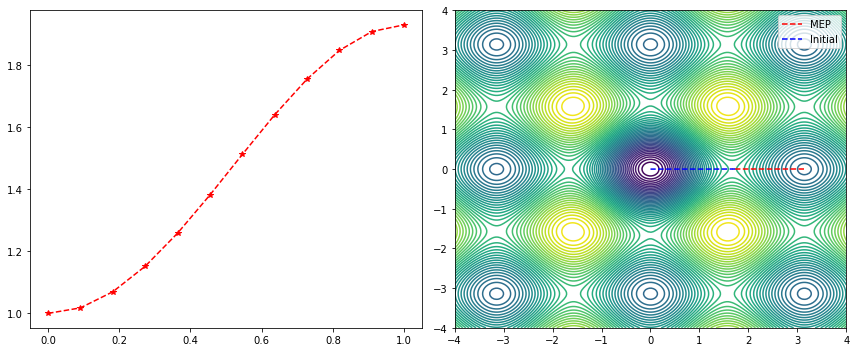

In [124]:
plt.figure(figsize=[12,5])
plt.subplot(1, 2, 1)
plt.plot(alpha,zfinal,'--r*')

plt.subplot(1, 2, 2)
plt.plot(Phi[:,0],Phi[:,1],'--r')
plt.contour(X,Y,Z,50)
plt.plot(I_string[:,0],I_string[:,1],'b--')
plt.legend(['MEP','Initial'])
# plt.plot(Phi[maxid,0],Phi[maxid,1])
# plt.scatter(I_string[N,0],I_string[N,1],c=1,marker='*')
# plt.xlim([-1,2])
# plt.plot(Phi[sec,0],Phi[sec,1],'g*')

plt.tight_layout()

(1.0, 2.0)

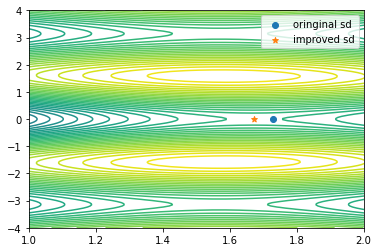

In [128]:
plt.scatter(I_string[0,0],I_string[0,1])
plt.scatter(Phi[-1,0],Phi[-1,1],marker='*')
plt.legend(['oringinal sd','improved sd'])
plt.contour(X,Y,Z,50)
plt.xlim([1,2])

In [129]:
I_string[0],Phi[-1]

(array([1.72938889, 0.00251865]), array([1.67324471e+00, 7.23374734e-14]))

In [130]:
LA.norm(gradient_V(I_string[0])),LA.norm(gradient_V(Phi[-1]))

(0.13819931092703847, 8.545516728264424e-05)